# Energy balance in Poland 2021, Scenario 7C

In [1]:
import datetime as dt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.subplots
import sys
from plotly import graph_objects as go

sys.path.append('../')
from energy_simulation.lcoe import EnergySource, calculate_lcoe

## Parameters

### Power

In [5]:
wind_onshore_gw = 70
wind_offshore_gw = 25
pv_gw = 85
nuclear_gw = 3
gas_gw = 13

### Storage

In [6]:
batteries_gwh = 40
ev_batteries_gwh = 50
psh_gwh = 10
storage_gwh = batteries_gwh + ev_batteries_gwh + psh_gwh

### Costs

In [2]:
wind_onshore = EnergySource(cost_per_gw=5.4,
                            max_power_perc=0.36,
                            o_and_m_per_gw_per_year=0.065,
                            o_and_m_per_twh=0.007,
                            years_to_launch=2,
                            years_of_operation=25)

wind_offshore = EnergySource(cost_per_gw=12.0,
                             max_power_perc=0.5,
                             o_and_m_per_gw_per_year=0.184,
                             o_and_m_per_twh=0.014,
                             years_to_launch=4,
                             years_of_operation=20)

pv = EnergySource(cost_per_gw=2.2,
                  max_power_perc=0.11,
                  o_and_m_per_gw_per_year=0.052,
                  o_and_m_per_twh=0.0,
                  years_to_launch=1,
                  years_of_operation=30)

nuclear = EnergySource(cost_per_gw=35,
                       max_power_perc=0.85,
                       o_and_m_per_gw_per_year=0.5,
                       o_and_m_per_twh=0.016,
                       years_to_launch=10,
                       years_of_operation=60)

gas = EnergySource(cost_per_gw=4,
                   max_power_perc=0.2,  # 0.01859,  # should be 20% originally
                   o_and_m_per_gw_per_year=0.0,
                   o_and_m_per_twh=0.5,
                   years_to_launch=3,
                   years_of_operation=40)

batteries = EnergySource(cost_per_gw=1,
                         max_power_perc=0.85,
                         o_and_m_per_gw_per_year=0.5,
                         o_and_m_per_twh=0.016,
                         years_to_launch=1,
                         years_of_operation=20)

### LCOE

In [4]:
wind_onshore_lcoe = calculate_lcoe(wind_onshore, discount_factor=0.05)
wind_offshore_lcoe = calculate_lcoe(wind_offshore, discount_factor=0.05)
pv_lcoe = calculate_lcoe(pv, discount_factor=0.05)
nuclear_lcoe = calculate_lcoe(nuclear, discount_factor=0.05)
gas_lcoe = calculate_lcoe(gas, discount_factor=0.05)

## Data

In [ ]:
df = pd.read_csv("../data.csv", parse_dates=[1], date_format="%m/%d/%y %H:%M").drop(columns=['id'])

In [ ]:
# Supply
df['energy_wind_onshore'] = df['wind_onshore'] * wind_onshore_gw
df['energy_wind_offshore'] = df['wind_offshore'] * wind_offshore_gw
df['energy_pv'] = df['pv'] * pv_gw
df['energy_nuclear'] = nuclear_gw * nuclear.max_power_perc
df['total_energy'] = df['energy_wind_onshore'] + df['energy_wind_offshore'] + df['energy_pv'] + df['energy_nuclear']

In [ ]:
# Demand
demand_forecast = 0.85
df['demand_other'] = df['demand'] * demand_forecast
ev_gw_per_year = 100_000
transport_forecast
df['demand_transport'] = ev_gw_per_year / 365 / 24 * transport_forecast
heat_gw_per_day = 0 # TODO
df['demand_heat'] = heat_gw_per_day / 24

In [ ]:
# TODO Flexibility

In [ ]:
# TODO Balance
df['delta'] = df['total_energy'] - df['demand']
df['storage'] = 0

# df['energy_gas'] = (df['demand'] - df['total_energy']).clip(lower=0) * gas_gw

In [9]:
df

,datetime,demand,wind_onshore,wind_offshore,pv,energy_wind_onshore,energy_wind_offshore,energy_pv,energy_nuclear,total_energy,delta,storage
0,2021-01-01 00:30:00,15.09,0.11,0.17,0.0,7.7,4.25,0.0,2.55,14.50,-0.59,0
1,2021-01-01 01:30:00,14.53,0.10,0.15,0.0,7.0,3.75,0.0,2.55,13.30,-1.23,0
2,2021-01-01 02:30:00,14.06,0.09,0.13,0.0,6.3,3.25,0.0,2.55,12.10,-1.96,0
3,2021-01-01 03:30:00,13.78,0.09,0.13,0.0,6.3,3.25,0.0,2.55,12.10,-1.68,0
4,2021-01-01 04:30:00,13.70,0.09,0.13,0.0,6.3,3.25,0.0,2.55,12.10,-1.60,0
...,...,...,...,...,...,...,...,...,...,...,...,...
8755,2021-12-31 19:30:00,18.86,1.00,1.00,0.0,70.0,25.00,0.0,2.55,97.55,78.69,0
8756,2021-12-31 20:30:00,17.66,0.99,1.00,0.0,69.3,25.00,0.0,2.55,96.85,79.19,0
8757,2021-12-31 21:30:00,16.66,0.92,1.00,0.0,64.4,25.00,0.0,2.55,91.95,75.29,0
8758,2021-12-31 22:30:00,16.16,0.84,1.00,0.0,58.8,25.00,0.0,2.55,86.35,70.19,0


In [10]:
def calc_storage(df: pd.DataFrame) -> tuple:
    df = df.reset_index(drop=True)
    storage = np.clip(df.loc[0, 'storage'] + df.loc[0, 'delta'], a_min=0, a_max=storage_gwh)
    return (storage,)

In [ ]:
it = iter(df[['delta', 'storage']].rolling(window=2, min_periods=2).apply(calc_storage))

In [ ]:
next(it)

## Energy balance charts

/home/adam/.conda/envs/ds/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



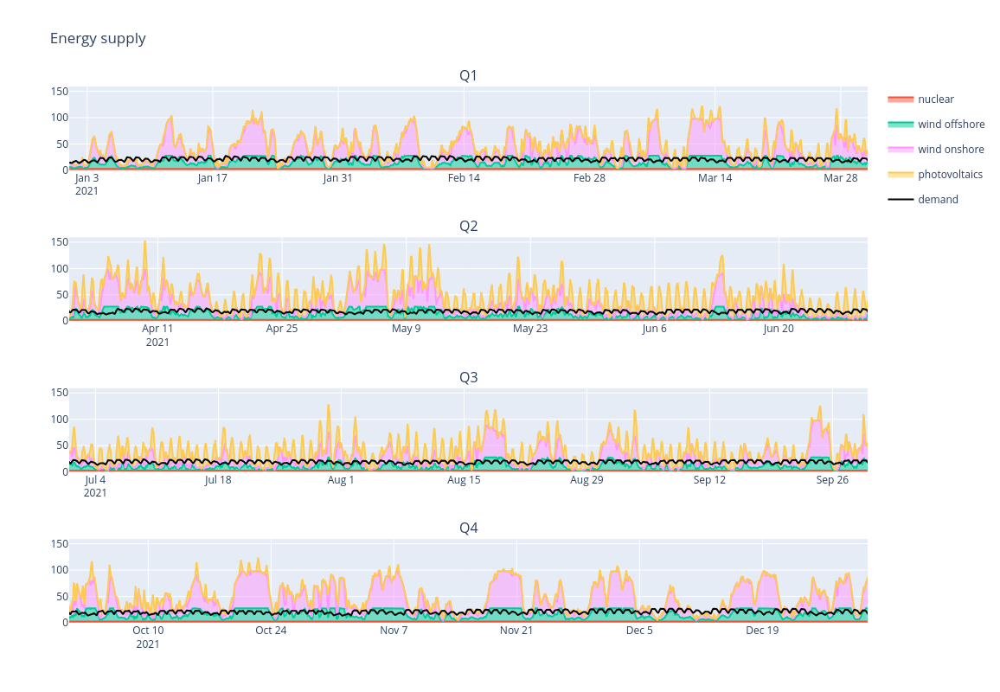

In [32]:
fig = plotly.subplots.make_subplots(
    rows=4,
    cols=1,
    subplot_titles=["Q1", "Q2", "Q3", "Q4"],
)

traces = [
    go.Scatter(x=df['datetime'], y=df['energy_nuclear'], legendgroup="nuclear", name='nuclear', stackgroup='1', line=dict(color='#EF553B')),
    go.Scatter(x=df['datetime'], y=df['energy_wind_offshore'], legendgroup="wind offshore", name='wind offshore', stackgroup='1', line=dict(color='#00CC96')),
    go.Scatter(x=df['datetime'], y=df['energy_wind_onshore'], legendgroup="wind onshore", name='wind onshore', stackgroup='1', line=dict(color='#FF97FF')),
    go.Scatter(x=df['datetime'], y=df['energy_pv'], legendgroup="photovoltaics", name='photovoltaics', stackgroup='1', line=dict(color='#FECB52')),
    go.Scatter(x=df['datetime'], y=df['demand'], legendgroup="deamnd", name='demand', mode='lines', line=dict(color='black')),
]
fig.add_traces(traces, rows=1, cols=1)
fig.update_xaxes(range=[dt.date(2021, 1, 1), dt.date(2021, 3, 31)], row=1, col=1)

traces = [
    go.Scatter(x=df['datetime'], y=df['energy_nuclear'], legendgroup="nuclear", name='nuclear', stackgroup='1', line=dict(color='#EF553B'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_wind_offshore'], legendgroup="wind offshore", name='wind offshore', stackgroup='1', line=dict(color='#00CC96'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_wind_onshore'], legendgroup="wind onshore", name='wind onshore', stackgroup='1', line=dict(color='#FF97FF'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_pv'], legendgroup="photovoltaics", name='photovoltaics', stackgroup='1', line=dict(color='#FECB52'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['demand'], legendgroup="deamnd", name='demand', mode='lines', line=dict(color='black'), showlegend=False),
]
fig.add_traces(traces, rows=2, cols=1)
fig.update_xaxes(range=[dt.date(2021, 4, 1), dt.date(2021, 6, 30)], row=2, col=1)

traces = [
    go.Scatter(x=df['datetime'], y=df['energy_nuclear'], legendgroup="nuclear", name='nuclear', stackgroup='1', line=dict(color='#EF553B'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_wind_offshore'], legendgroup="wind offshore", name='wind offshore', stackgroup='1', line=dict(color='#00CC96'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_wind_onshore'], legendgroup="wind onshore", name='wind onshore', stackgroup='1', line=dict(color='#FF97FF'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_pv'], legendgroup="photovoltaics", name='photovoltaics', stackgroup='1', line=dict(color='#FECB52'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['demand'], legendgroup="deamnd", name='demand', mode='lines', line=dict(color='black'), showlegend=False),
]
fig.add_traces(traces, rows=3, cols=1)
fig.update_xaxes(range=[dt.date(2021, 7, 1), dt.date(2021, 9, 30)], row=3, col=1)

traces = [
    go.Scatter(x=df['datetime'], y=df['energy_nuclear'], legendgroup="nuclear", name='nuclear', stackgroup='1', line=dict(color='#EF553B'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_wind_offshore'], legendgroup="wind offshore", name='wind offshore', stackgroup='1', line=dict(color='#00CC96'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_wind_onshore'], legendgroup="wind onshore", name='wind onshore', stackgroup='1', line=dict(color='#FF97FF'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['energy_pv'], legendgroup="photovoltaics", name='photovoltaics', stackgroup='1', line=dict(color='#FECB52'), showlegend=False),
    go.Scatter(x=df['datetime'], y=df['demand'], legendgroup="deamnd", name='demand', mode='lines', line=dict(color='black'), showlegend=False),
]
fig.add_traces(traces, rows=4, cols=1)
fig.update_xaxes(range=[dt.date(2021, 10, 1), dt.date(2021, 12, 31)], row=4, col=1)

fig.update_layout(height=800, title='Energy supply')
fig.show()